## ***1. Social Network Analysis Comprehensive Mobility Metrices***

The script builds seasonal mobility flow networks for Wyoming counties and gathers movement and network centrality data for each county over several years. It works with July and December data from 2018 to 2024, using pre-aggregated mobility files that show, for each destination Census Block Group in Wyoming, where visiting devices came from. For each time point, the DEVICE_HOME_AREAS field is used to find origin CBGs and their visit counts, which are then summed up at the county-to-county level. Only flows where a Wyoming county is the destination are kept. These flows are grouped into total inflow from all origins (excluding visits within the same county), movement within a county, inflow from other Wyoming counties, inflow from out-of-state counties, and outflow from each Wyoming county to other Wyoming counties. The script also tracks how many different origin counties send visitors to each Wyoming destination, separating in-state and out-of-state sources.

Using these flows, the script creates two types of network graphs: a directed, weighted graph from origin to Wyoming destination (without self-loops) and an undirected, weighted graph for certain centrality measures. For each Wyoming county, it calculates network metrics such as in-degree and out-degree (number of unique connections), weighted in-degree and out-degree and strength (total trips), PageRank (influence in the network), closeness and weighted closeness (how easily a county can be reached), betweenness (how often a county is on the shortest path between others), and eigenvector centrality (connections to other well-connected counties). All these metrics are saved for each year and season.

Once all years and seasons are processed, the script creates summary tables for each metric. Each table lists Wyoming counties as rows and seasonal snapshots like 2019-July, 2019-December, and 2024-December as columns. All tables are combined into one Excel workbook, with a separate sheet for each metric. This setup gives a clear and easy way to compare how mobility patterns, county connections, and network roles change for each Wyoming county over time.



In [9]:
import pandas as pd
import json
import networkx as nx
import numpy as np

# Configuration
data_dir = r"F:\Yellow Stone Flood-2022\floodanalysis\Data\Advan Mobility\\"  
years    = list(range(2018, 2025))  # 2018 through 2024
seasons  = ["July", "Dec"]          # Two seasons of interest each year

# Wyoming county FIPS codes and names (state code 56 + county code)
wyoming_county_names = {
    "56001": "Albany",    "56003": "Big Horn",  "56005": "Campbell", "56007": "Carbon",
    "56009": "Converse",  "56011": "Crook",     "56013": "Fremont",  "56015": "Goshen",
    "56017": "Hot Springs","56019": "Johnson",  "56021": "Laramie",  "56023": "Lincoln",
    "56025": "Natrona",   "56027": "Niobrara",  "56029": "Park",     "56031": "Platte",
    "56033": "Sheridan",  "56035": "Sublette",  "56037": "Sweetwater","56039": "Teton",
    "56041": "Uinta",     "56043": "Washakie",  "56045": "Weston"
}
wy_county_fips = set(wyoming_county_names.keys())

# Prepare data structures to collect results
metrics = {
    # Flow metrics (destination is always a WY county)
    "Total_Inflow": {},              # Incoming trips from WY + out-of-state, excluding self-loops
    "Internal_Flow": {},             # Intra-county flow (self-loops)
    "Inflow_InState": {},            # Inflow from other WY counties (no self)
    "Inflow_OutState": {},           # Inflow from out-of-state
    "Outflow_to_WY": {},             # Outflow to other WY counties (no self)
    "Distinct_Origins_Total": {},    # Distinct origins (WY + out-of-state) excluding the destination itself
    "Distinct_Origins_WY": {},       # Distinct WY origins excluding the destination itself
    "Distinct_Origins_OutState": {}, # Distinct out-of-state origin counties

    # Network centrality metrics computed on the FULL inflow network:
    # nodes = WY destinations plus any origin counties (WY or out-of-state) that send flow to 
    # edges = (any origin) to (WY destination), excluding self-loops
    # store centrality values ONLY for WY counties (dest nodes)
    "InDegree": {},
    "OutDegree": {},
    "Weighted_InDegree": {},
    "Weighted_OutDegree": {},
    "Weighted_InStrength": {},      
    "Weighted_OutStrength": {},      
    "Closeness": {},
    "Weighted_Closeness": {},
    "Betweenness": {},
    "Eigenvector": {},
    "PageRank": {}
}

def safe_parse(json_str):
    """Safely parse JSON string from DEVICE_HOME_AREAS column"""
    try:
        return json.loads(json_str)
    except Exception:
        return {}

# Process each year and season
for year in years:
    for season in seasons:
        file_name = f"{season}_{year}_Only.csv"
        file_path = data_dir + file_name

        try:
            df = pd.read_csv(file_path)
        except FileNotFoundError:
            print(f"Warning: File not found '{file_path}'. Skipping.")
            continue

        # Parse DEVICE_HOME_AREAS JSON
        df["home_dict"] = df["DEVICE_HOME_AREAS"].apply(safe_parse)

        # Expand to flow records: (origin_county, dest_county, count)
        flow_records = []
        for _, row in df.iterrows():
            dest_cbg = str(row["AREA"]).strip()
            dest_cnty = dest_cbg[:5]

            for origin_cbg, count in row["home_dict"].items():
                origin_cbg = str(origin_cbg).strip()
                origin_cnty = origin_cbg[:5]
                flow_records.append((origin_cnty, dest_cnty, count))

        flows_df = pd.DataFrame(flow_records, columns=["origin_cnty", "dest_cnty", "count"])

        # Aggregate by county pair
        agg = flows_df.groupby(["origin_cnty", "dest_cnty"], as_index=False)["count"].sum()

        # Keep only Wyoming destinations (analyze inflow into WY)
        agg = agg[agg["dest_cnty"].isin(wy_county_fips)].copy()

        snapshot_key = (year, season)

        # Initialize metric storage for this snapshot
        for metric in metrics:
            metrics[metric][snapshot_key] = {}

        # BASIC FLOW METRICS 
     
        no_self = agg["origin_cnty"] != agg["dest_cnty"]

        # Total inflow EXCLUDING self-loops (from WY + out-of-state)
        total_inflow_no_self = agg[no_self].groupby("dest_cnty")["count"].sum()

        # Internal flows (self-loops)
        internal = agg[~no_self].set_index("dest_cnty")["count"]

        # Inflows from other WY counties
        in_from_other_wy = agg[
            agg["origin_cnty"].isin(wy_county_fips) & no_self
        ].groupby("dest_cnty")["count"].sum()

        # Inflows from out-of-state
        in_from_out = agg[
            ~agg["origin_cnty"].isin(wy_county_fips)
        ].groupby("dest_cnty")["count"].sum()

        # Outflows to other WY counties
        out_to_other_wy = agg[
            agg["origin_cnty"].isin(wy_county_fips) &
            agg["dest_cnty"].isin(wy_county_fips) &
            no_self
        ].groupby("origin_cnty")["count"].sum()

        # Distinct origin counts EXCLUDING self (
        distinct_total_no_self = agg[no_self].groupby("dest_cnty")["origin_cnty"].nunique()
        distinct_wy_no_self = agg[
            agg["origin_cnty"].isin(wy_county_fips) & no_self
        ].groupby("dest_cnty")["origin_cnty"].nunique()
        distinct_out = agg[
            ~agg["origin_cnty"].isin(wy_county_fips)
        ].groupby("dest_cnty")["origin_cnty"].nunique()

        _ti = total_inflow_no_self.reindex(wy_county_fips, fill_value=0)
        _is = in_from_other_wy.reindex(wy_county_fips, fill_value=0)
        _os = in_from_out.reindex(wy_county_fips, fill_value=0)
        if not (_ti.equals(_is + _os)):
            print("Warning: Inflow identity check failed for", snapshot_key)

        # Build the complete inflow network to WY. Self-loops are not included.
        # Nodes include all origins, both WY and non-WY, as well as WY destinations.
        # Edges connect each origin to a WY destination. Self-loops are not allowed.
        G = nx.DiGraph()

        # Include all possible nodes present in flows to WY
        all_nodes = set(agg["origin_cnty"]).union(set(agg["dest_cnty"]))
        G.add_nodes_from(all_nodes)

        # Add edges ONLY where origin != destination 
        flows_to_wy = agg[agg["dest_cnty"].isin(wy_county_fips) & no_self]
        for _, row in flows_to_wy.iterrows():
            G.add_edge(row["origin_cnty"], row["dest_cnty"], weight=row["count"])

        # Confirm no self-loops in directed graph
        selfloop_count = nx.number_of_selfloops(G)
        if selfloop_count > 0:
            print(f"WARNING: {selfloop_count} self-loops found in directed graph G for {snapshot_key}")
            G.remove_edges_from(nx.selfloop_edges(G))

        # Degrees (unweighted counts of neighbors)
        in_degree = dict(G.in_degree())
        out_degree = dict(G.out_degree())

        # Weighted degree (strengths)
        weighted_in = dict(G.in_degree(weight='weight'))
        weighted_out = dict(G.out_degree(weight='weight'))

        # PageRank (directed, weighted)
        try:
            pagerank = nx.pagerank(G, alpha=0.85, weight='weight')
        except nx.PowerIterationFailedConvergence:
            pagerank = nx.pagerank(G, alpha=0.85, weight=None)

  
        # Undirected network for closeness/betweenness/eigenvector
        W = nx.Graph()
        W.add_nodes_from(G.nodes())
        
        for u, v, data in G.edges(data=True):
            if u == v:
                continue
                
            w = data.get('weight', 0)
            if W.has_edge(u, v):
                W[u][v]['weight'] += w
            else:
                W.add_edge(u, v, weight=w)

        selfloop_count_W = nx.number_of_selfloops(W)
        if selfloop_count_W > 0:
            print(f"WARNING: {selfloop_count_W} self-loops found in undirected graph W for {snapshot_key}")
            # Remove any self-loops
            W.remove_edges_from(nx.selfloop_edges(W))

        # Closeness (unweighted)
        closeness = nx.closeness_centrality(W, distance=None)

        # Weighted closeness using distance = 1/weight
        if W.number_of_edges() > 0:
            try:
                for u, v, data in W.edges(data=True):
                    data['distance'] = (1.0 / data['weight']) if data['weight'] > 0 else float('inf')
                weighted_closeness = nx.closeness_centrality(W, distance='distance')
            except Exception:
                weighted_closeness = closeness.copy()
        else:
            weighted_closeness = {n: 0.0 for n in W.nodes()}

        # Betweenness (unweighted shortest paths)
        betweenness = nx.betweenness_centrality(W, weight=None)

        # Eigenvector (weighted)
        try:
            eigenvector = nx.eigenvector_centrality_numpy(W, weight='weight', max_iter=1000)
        except Exception:
            eigenvector = {n: 0.0 for n in W.nodes()}

        # STORE ALL METRICS (for WY counties only)
        for cnty in wy_county_fips:
            # Flow metrics
            metrics["Total_Inflow"][snapshot_key][cnty] = int(total_inflow_no_self.get(cnty, 0))
            metrics["Internal_Flow"][snapshot_key][cnty] = int(internal.get(cnty, 0))
            metrics["Inflow_InState"][snapshot_key][cnty] = int(in_from_other_wy.get(cnty, 0))
            metrics["Inflow_OutState"][snapshot_key][cnty] = int(in_from_out.get(cnty, 0))
            metrics["Outflow_to_WY"][snapshot_key][cnty] = int(out_to_other_wy.get(cnty, 0))

            metrics["Distinct_Origins_Total"][snapshot_key][cnty] = int(distinct_total_no_self.get(cnty, 0))
            metrics["Distinct_Origins_WY"][snapshot_key][cnty] = int(distinct_wy_no_self.get(cnty, 0))
            metrics["Distinct_Origins_OutState"][snapshot_key][cnty] = int(distinct_out.get(cnty, 0))

            # Network metrics 
            metrics["InDegree"][snapshot_key][cnty] = int(in_degree.get(cnty, 0))
            metrics["OutDegree"][snapshot_key][cnty] = int(out_degree.get(cnty, 0))
            metrics["Weighted_InDegree"][snapshot_key][cnty] = int(weighted_in.get(cnty, 0))
            metrics["Weighted_OutDegree"][snapshot_key][cnty] = int(weighted_out.get(cnty, 0))

            # Strengths for WY nodes 
            metrics["Weighted_InStrength"][snapshot_key][cnty]  = int(weighted_in.get(cnty, 0))
            metrics["Weighted_OutStrength"][snapshot_key][cnty] = int(weighted_out.get(cnty, 0))

            metrics["Closeness"][snapshot_key][cnty] = float(closeness.get(cnty, 0.0))
            metrics["Weighted_Closeness"][snapshot_key][cnty] = float(weighted_closeness.get(cnty, 0.0))
            metrics["Betweenness"][snapshot_key][cnty] = float(betweenness.get(cnty, 0.0))
            metrics["Eigenvector"][snapshot_key][cnty] = float(eigenvector.get(cnty, 0.0))
            metrics["PageRank"][snapshot_key][cnty] = float(pagerank.get(cnty, 0.0))

        print(f"Processed: {year}-{season} | Directed edges: {G.number_of_edges()} | Undirected edges: {W.number_of_edges()}")

# Create Output DataFrame for each metric 

snapshots = [f"{yr}-{ssn}" for yr in years for ssn in seasons if (yr, ssn) in metrics["Total_Inflow"]]


metric_dfs = {}
for metric, data in metrics.items():
    df_metric = pd.DataFrame({
        f"{yr}-{ssn}": pd.Series(vals)
        for (yr, ssn), vals in data.items()
    })

    for cnty in wy_county_fips:
        if cnty not in df_metric.index:
            df_metric.loc[cnty] = 0

    df_metric = df_metric.sort_index().fillna(0)

    # Replace FIPS with county names 
    df_metric.index = df_metric.index.map(lambda x: wyoming_county_names.get(x, x))

    metric_dfs[metric] = df_metric

# Display sample output
print("\n" + "="*80)
print("Sample Output: Total Inflow (NO SELF-LOOPS) by County and Time Period")
print("="*80)
print(metric_dfs["Total_Inflow"])

# Save to Excel
output_path = data_dir + "WY_Mobility2_FullInflow_Network_Metrics_2018-2024.xlsx"
with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
    for metric, df_metric in metric_dfs.items():
        sheet_name = metric if len(metric) <= 31 else metric[:31]
        df_metric.to_excel(writer, sheet_name=sheet_name)

print(f"\n All metrics saved to: {output_path}")

Processed: 2018-July | Directed edges: 16048 | Undirected edges: 15827
Processed: 2018-Dec | Directed edges: 6312 | Undirected edges: 6119
Processed: 2019-July | Directed edges: 13611 | Undirected edges: 13392
Processed: 2019-Dec | Directed edges: 4814 | Undirected edges: 4641
Processed: 2020-July | Directed edges: 12343 | Undirected edges: 12124
Processed: 2020-Dec | Directed edges: 4457 | Undirected edges: 4295
Processed: 2021-July | Directed edges: 16663 | Undirected edges: 16446
Processed: 2021-Dec | Directed edges: 4724 | Undirected edges: 4555
Processed: 2022-July | Directed edges: 15933 | Undirected edges: 15711
Processed: 2022-Dec | Directed edges: 5844 | Undirected edges: 5658
Processed: 2023-July | Directed edges: 20044 | Undirected edges: 19814
Processed: 2023-Dec | Directed edges: 8853 | Undirected edges: 8655
Processed: 2024-July | Directed edges: 18670 | Undirected edges: 18439
Processed: 2024-Dec | Directed edges: 7775 | Undirected edges: 7585

Sample Output: Total Inflo

## ***2. Visualizing the Mobility Metrices***

In this section, we present plots and dashboards that illustrate changes in mobility and network connections across Wyoming counties over seasons and years. Our goal is to make complex data clear and actionable.

Our visual analyses will include:

* Time Series Plots: to track changes in mobility metrics, such as inflow and network centrality, for selected counties and statewide.
* Heatmaps: to highlight spatial and seasonal variations in mobility patterns across all counties.
* Normalized Comparisons: to place metrics on a common scale for fair comparison among counties with varying populations or mobility levels.
* COVID Impact Panels: to visually compare mobility before, during, and after the pandemic.
* Correlation Evolution: to analyze how inter-county relationships and dependencies evolved over time.
* Radar Plots: These will let us compare multiple metrics for each county or season. This helps highlight strengths, weaknesses, and changes over the years, such as differences between July and December.

These visualizations will provide a clearer understanding of mobility patterns in Wyoming over time and across regions, including the effects of seasons, geography, and the COVID-19 pandemic.

### ***2.1 Loading Mobility Metrices Datasets***

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# global plot style

mpl.rcParams.update({
    "font.family": "Arial",
    "font.size": 8,
    "axes.titlesize": 10,
    "axes.labelsize": 10,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8,
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "savefig.bbox": "tight",
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.linewidth": 0.8,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
})


# paths

data_dir = Path(r"F:\Yellow Stone Flood-2022\floodanalysis\Data\Advan Mobility")
input_file = data_dir / "WY_Mobility_FullInflow_Network_Metrics_2018-2024.xlsx"
output_dir = data_dir / "Mobility Metrices Plots"
output_dir.mkdir(exist_ok=True)

excel_file = pd.ExcelFile(input_file)
sheet_names = excel_file.sheet_names

# read each sheet (metric) into dict
data = {}
for sheet in sheet_names:
    df_metric = pd.read_excel(input_file, sheet_name=sheet, index_col=0)
    data[sheet] = df_metric

# shared axes info
time_periods = data[sheet_names[0]].columns.tolist()  
counties = data[sheet_names[0]].index.tolist()
time_numeric = np.arange(len(time_periods))

# covid marker index 
covid_start_idx = None
for i, p in enumerate(time_periods):
    if "2020" in p:
        covid_start_idx = i
        break

print("Loaded metrics:", sheet_names)
print("Time periods:", time_periods[0], "→", time_periods[-1])
print("Num counties:", len(counties), "| covid_start_idx:", covid_start_idx)

# consistent color per county
county_colors = {}
cmap = plt.get_cmap("tab20")
for i, county in enumerate(counties):
    county_colors[county] = cmap(i % 20)

# helper: make tick labels 
def format_period_label(period):
    year, season = period.split('-')
    return f"{season[:3]} '{year[-2:]}"


Loaded metrics: ['Total_Inflow', 'Internal_Flow', 'Inflow_InState', 'Inflow_OutState', 'Outflow_to_WY', 'Distinct_Origins_Total', 'Distinct_Origins_WY', 'Distinct_Origins_OutState', 'InDegree', 'OutDegree', 'Weighted_InDegree', 'Weighted_OutDegree', 'Weighted_InStrength', 'Weighted_OutStrength', 'Closeness', 'Weighted_Closeness', 'Betweenness', 'Eigenvector', 'PageRank']
Time periods: 2018-July → 2024-Dec
Num counties: 23 | covid_start_idx: 4


### ***2.2 Helper Functions for Visual Exploration — Plotting Time Series, Heatmaps, COVID-19 Impacts, and Normalized Trends***

In [11]:
def plot_clean_timeseries_top(metric_name, df, top_n=10, covid_idx=None, savepath=None):
    """
Creates a line plot showing the top N counties for a given metric over all snapshots.

Places the legend outside the plot for better readability. If a save path is provided, the plot is saved to disk.
    """
    mean_values = df.mean(axis=1).sort_values(ascending=False)
    top_counties = mean_values.head(top_n).index.tolist()
    
    fig, ax = plt.subplots(figsize=(7, 4))
    handles, labels = [], []
    
    for county in top_counties:
        y = df.loc[county].values
        (line,) = ax.plot(
            time_numeric, y,
            marker='o', markersize=3,
            linewidth=1.5,
            color=county_colors[county],
            alpha=0.9,
            label=county
        )
        handles.append(line)
        labels.append(county)
    
    # covid marker
    if covid_idx is not None:
        ax.axvline(x=covid_idx, color='gray', linestyle='--', linewidth=1.0, alpha=0.6)
        ax.text(
            covid_idx, ax.get_ylim()[1] * 0.95, "COVID-19",
            fontsize=7, color='gray', ha='right', va='top',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.7)
        )
    
    ax.set_title(f"{metric_name.replace('_',' ')} (Top {top_n} Counties)", weight="bold", fontsize=11)
    ax.set_ylabel(metric_name.replace('_',' '), fontsize=10)
    ax.set_xlabel("Time Period", fontsize=10)
    
    ax.set_xticks(time_numeric[::2])
    ax.set_xticklabels([format_period_label(time_periods[i]) for i in range(0, len(time_periods), 2)],
                       rotation=45, ha='right', fontsize=8)
    
    ax.grid(axis='y', alpha=0.15, linewidth=0.6)
    ax.set_xlim(-0.5, time_numeric[-1] + 0.5)
    
   
    ax.legend(
        handles, labels,
        loc='center left', bbox_to_anchor=(1.02, 0.5),
        frameon=True, fontsize=8,
        title="County", title_fontsize=9
    )
    
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)


def plot_timeseries_all(metric_name, df, covid_idx=None, savepath=None):

    fig, ax = plt.subplots(figsize=(8, 5))
    handles, labels = [], []
    
    for county in df.index:
        y = df.loc[county].values
        (line,) = ax.plot(
            time_numeric, y,
            linewidth=1.0, marker='o', markersize=2,
            color=county_colors[county],
            alpha=0.5,
            label=county
        )
        handles.append(line)
        labels.append(county)
    
    if covid_idx is not None:
        ax.axvline(x=covid_idx, color='gray', linestyle='--', linewidth=1.2, alpha=0.7)
        ax.text(
            covid_idx, ax.get_ylim()[1] * 0.95, "COVID-19",
            fontsize=8, color='gray', ha='right', va='top',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.7)
        )
    
    ax.set_title(f"{metric_name.replace('_',' ')} (All {len(df.index)} Counties)", weight="bold", fontsize=11)
    ax.set_ylabel(metric_name.replace('_',' '), fontsize=10)
    ax.set_xlabel("Time Period", fontsize=10)
    
    ax.set_xticks(time_numeric[::2])
    ax.set_xticklabels([format_period_label(time_periods[i]) for i in range(0, len(time_periods), 2)],
                       rotation=45, ha='right', fontsize=8)
    
    ax.grid(axis='y', alpha=0.15, linewidth=0.6)
    
    ax.legend(
        handles, labels,
        loc='center left', bbox_to_anchor=(1.02, 0.5),
        frameon=True, fontsize=7, ncol=2,
        title="County", title_fontsize=8
    )
    
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)


def plot_heatmap_timeseries(metric_name, df, top_n=15, covid_idx=None, savepath=None):
    """
    This heatmap shows the top counties by average metric values. Each row represents a county, and each column shows a different point in time.
    """
    county_order = df.mean(axis=1).sort_values(ascending=False).index.tolist()
    df_sorted = df.loc[county_order[:top_n]].copy()
    df_sorted = df_sorted[time_periods]  
    
    vmin = df_sorted.min().min()
    vmax = df_sorted.max().max()
    
    fig, ax = plt.subplots(figsize=(7, 4))
    im = ax.imshow(df_sorted.values, aspect='auto',
                   vmin=vmin, vmax=vmax, cmap='magma')
    
    ax.set_yticks(range(len(df_sorted.index)))
    ax.set_yticklabels(df_sorted.index, fontsize=8)
    
    ax.set_xticks(range(len(df_sorted.columns)))
    ax.set_xticklabels([format_period_label(tp) for tp in df_sorted.columns],
                       rotation=45, ha='right', fontsize=7)
    
    ax.set_title(f"{metric_name.replace('_',' ')} (Top {top_n} Counties)",
                 fontsize=11, weight='bold')
    ax.set_xlabel("Time Period", fontsize=10)
    ax.set_ylabel("County", fontsize=10)
    
    if covid_idx is not None:
        ax.axvline(x=covid_idx, color='white', linestyle='--', linewidth=1.5)
    
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.set_ylabel(metric_name.replace('_',' '),
                       rotation=270, labelpad=12, fontsize=8)
    cbar.ax.tick_params(labelsize=7)
    
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)


def plot_covid_impact(metric_name, df, savepath=None):
    """
    Bar Panel:
       - left: mean pre, during, and post COVID per county

        - right: % change during vs pre, showing impact on network position.


    """
    pre_covid    = [col for col in df.columns if ('2018' in col or '2019' in col)]
    during_covid = [col for col in df.columns if any(y in col for y in ['2020','2021','2022','2023'])]
    post_covid   = [col for col in df.columns if '2024' in col]
    if not pre_covid or not during_covid or not post_covid:
        return
    
    pre_avg    = df[pre_covid].mean(axis=1)
    during_avg = df[during_covid].mean(axis=1)
    post_avg   = df[post_covid].mean(axis=1)
    
    top_counties = pre_avg.sort_values(ascending=False).head(12).index.tolist()
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4.5))
    
    x = np.arange(len(top_counties))
    width = 0.25
    
    ax1.bar(x - width, pre_avg[top_counties], width,
            label="Pre ('18–'19)", color='steelblue', alpha=0.85)
    ax1.bar(x, during_avg[top_counties], width,
            label="During ('20–'23)", color='coral', alpha=0.85)
    ax1.bar(x + width, post_avg[top_counties], width,
            label="Post ('24)", color='green', alpha=0.85)
    
    ax1.set_xlabel('County', fontsize=10, weight='bold')
    ax1.set_ylabel(metric_name.replace('_', ' '), fontsize=10, weight='bold')
    ax1.set_title(f'{metric_name.replace("_", " ")}: Pre / During / Post COVID',
                  fontsize=11, weight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(top_counties, rotation=45, ha='right', fontsize=8)
    ax1.legend(frameon=True, loc='best', fontsize=8)
    ax1.grid(axis='y', alpha=0.15, linewidth=0.6)
    
    pct_change_during = ((during_avg - pre_avg) / (pre_avg + 1)) * 100
    top_changes = pct_change_during.sort_values(ascending=False).head(12)
    colors_change = ['green' if v >= 0 else 'red' for v in top_changes.values]
    
    ax2.barh(range(len(top_changes)), top_changes.values,
             color=colors_change, alpha=0.7)
    
    for j, val in enumerate(top_changes.values):
        ax2.text(val, j, f"{val:.1f}%",
                 va='center',
                 ha='left' if val >= 0 else 'right',
                 fontsize=7)
    
    ax2.set_yticks(range(len(top_changes)))
    ax2.set_yticklabels(top_changes.index, fontsize=8)
    ax2.set_xlabel('Change During COVID (%)', fontsize=10, weight='bold')
    ax2.set_title('Impact on Network Position\n(During vs Pre)',
                  fontsize=11, weight='bold')
    ax2.axvline(x=0, color='black', linestyle='-', linewidth=0.8)
    ax2.grid(axis='x', alpha=0.15, linewidth=0.6)
    
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)

### ***2.3 Seasonal Radar Patterns — Comparing July and December Over the Years***

In [12]:
def _build_period_list_for_season(season_label, all_periods):
    out = []
    for yr in range(2018, 2025):
        candidate = f"{yr}-{season_label}"
        if candidate in all_periods:
            out.append(candidate)
    return out

def plot_radar_by_season(
    season_label,
    counties_to_compare,
    metrics_to_include,
    savepath=None
):
    """
    There is a single row of radar charts, with each chart representing a different year, such as July 2018 or July 2019.

    For each period, the values for every metric are scaled between 0 and 1.
    """
    periods = _build_period_list_for_season(season_label, time_periods)
    n_periods = len(periods)
    if n_periods == 0:
        print(f"No periods found for {season_label}")
        return
    
    fig, axes = plt.subplots(
        1, n_periods,
        figsize=(4*n_periods, 4),
        subplot_kw=dict(projection='polar')
    )
    if n_periods == 1:
        axes = [axes]
    
    for ax_idx, period in enumerate(periods):
        ax = axes[ax_idx]
        
        # collect metrics for this snapshot into dataframe
        snapshot_cols = {}
        for metric in metrics_to_include:
            if metric in data and period in data[metric].columns:
                vals = data[metric][period]  # Series indexed by county
                snapshot_cols[metric.replace('_',' ')] = vals
        if not snapshot_cols:
            ax.set_axis_off()
            continue
        
        df_period = pd.DataFrame(snapshot_cols)      # rows=counties, cols=metrics
        df_period = df_period.loc[counties_to_compare]
        
        # normalize each metric col to [0,1] across these counties
        df_norm = (df_period - df_period.min()) / (df_period.max() - df_period.min() + 1e-12)
        
        # radar geometry
        num_vars = df_norm.shape[1]
        angles = np.linspace(0, 2*np.pi, num_vars, endpoint=False).tolist()
        angles += angles[:1]
        
        # plot one polygon per county
        for county in counties_to_compare:
            if county not in df_norm.index:
                continue
            vals = df_norm.loc[county].values.tolist()
            vals += vals[:1]
            
            ax.plot(
                angles, vals,
                marker='o',
                linewidth=1.8,
                markersize=4,
                alpha=0.8,
                color=county_colors[county],
                label=county
            )
            ax.fill(
                angles, vals,
                alpha=0.15,
                color=county_colors[county]
            )
        
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(df_norm.columns, fontsize=7)
        ax.set_ylim(0, 1)
        ax.set_yticks([0.25, 0.5, 0.75, 1.0])
        ax.set_yticklabels(['0.25','0.5','0.75','1.0'], fontsize=6)
        ax.grid(alpha=0.4, linewidth=0.6, linestyle='--')
        
        # marking COVID-era panels in red title
        if any(y in period for y in ["2020","2021","2022","2023"]):
            ax.set_title(period + "\n(COVID)", fontsize=8, fontweight='bold', color='red')
        else:
            ax.set_title(period, fontsize=8, fontweight='bold', color='black')
    
    # Common legend across the whole figure
    handles = []
    labels = []
    for c in counties_to_compare:
        handles.append(
            mpl.lines.Line2D(
                [0],[0],
                color=county_colors[c],
                marker='o',
                linewidth=2,
                markersize=5,
                alpha=0.8
            )
        )
        labels.append(c)
    
    fig.legend(
        handles, labels,
        loc='lower center',
        ncol=min(len(labels), 6),
        frameon=True,
        fontsize=9,
        title=f"Counties ({season_label})",
        title_fontsize=9
    )
    
    fig.suptitle(
        f"Radar profile across years ({season_label} snapshots only)\nMetrics normalized within each snapshot",
        fontsize=12,
        fontweight='bold',
        y=0.98
    )
    plt.tight_layout(rect=[0,0.1,1,0.95])
    
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)


### ***2.4 Correlation Evolution Over Time***

In [13]:
def plot_correlation_evolution(metrics_list, savepath=None):
    """
     For the selected snapshots, mainly from July each year, display how the different metrics correlate with each other.
     This will help us see if counties with high InDegree also tend to have high PageRank.
    """
    key_periods = ['2019-July', '2020-July', '2021-July', '2022-July', '2023-July', '2024-July']
    available = [p for p in key_periods if p in time_periods]
    
    n = len(available)
    fig, axes = plt.subplots(2, 3, figsize=(14, 9))
    axes = axes.flatten()
    
    for idx, period in enumerate(available):
        ax = axes[idx]

        corr_data = {}
        for metric in metrics_list:
            if metric in data and period in data[metric].columns:
                corr_data[metric.replace('_',' ')] = data[metric][period].values
        if not corr_data:
            ax.set_axis_off()
            continue
        
        corr_df = pd.DataFrame(corr_data, index=counties)
        corr_mat = corr_df.corr()
        
        im = ax.imshow(
            corr_mat.values,
            cmap='coolwarm', vmin=-1, vmax=1, aspect='auto'
        )
        
        n_metrics_here = len(corr_mat)
        ax.set_xticks(range(n_metrics_here))
        ax.set_yticks(range(n_metrics_here))
        ax.set_xticklabels(corr_mat.columns, rotation=45, ha='right', fontsize=7)
        ax.set_yticklabels(corr_mat.index, fontsize=7)
        
        for i in range(n_metrics_here):
            for j in range(i+1, n_metrics_here):
                ax.text(
                    j, i, f"{corr_mat.iloc[i,j]:.2f}",
                    ha="center", va="center",
                    color="black", fontsize=7
                )
        
        if any(y in period for y in ["2020","2021","2022","2023"]):
            ax.set_title(period + "\n(COVID)",
                         fontsize=10, weight='bold', color='red')
            for spine in ax.spines.values():
                spine.set_edgecolor('red')
                spine.set_linewidth(2)
        else:
            ax.set_title(period,
                         fontsize=10, weight='bold')
    

    for j in range(n, len(axes)):
        axes[j].set_axis_off()
    
    # single shared colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
    fig.colorbar(
        mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=-1, vmax=1), cmap='coolwarm'),
        cax=cbar_ax,
        label="Correlation"
    )
    
    fig.suptitle(
        "Metric correlation structure over time (July snapshots)",
        fontsize=13, fontweight='bold', y=0.98
    )
    plt.tight_layout(rect=[0,0,0.9,0.95])
    
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)


### ***2.5 County-Level Normalized Evolution***

In [14]:
def plot_normalized_comparison(metrics_list, county_name, covid_idx=None, savepath=None):
    """
      Track several metrics over time for a single county.
      For each county, adjust every metric so its values fall between 0 and 1, using data from 2018 to 2024.
    """
    fig, ax = plt.subplots(figsize=(7, 4))
    metric_colors = plt.get_cmap("Set2").colors
    
    for idx, metric in enumerate(metrics_list):
        if metric not in data or county_name not in data[metric].index:
            continue
        
        vals = data[metric].loc[county_name].values
        norm_vals = (vals - vals.min()) / (vals.max() - vals.min() + 1e-10)
        
        ax.plot(
            time_numeric, norm_vals,
            marker='o', linewidth=2, markersize=4,
            label=metric.replace('_', ' '),
            color=metric_colors[idx % len(metric_colors)], alpha=0.85
        )
    
    if covid_idx is not None:
        ax.axvline(x=covid_idx, color='gray', linestyle='--', linewidth=1.0, alpha=0.6)
        ax.axvspan(covid_idx-0.5, covid_idx+7, alpha=0.08, color='red')
    
    ax.set_xlabel('Time Period', fontsize=10, weight='bold')
    ax.set_ylabel('Normalized Value (0-1)', fontsize=10, weight='bold')
    ax.set_title(f'Network Metrics Evolution: {county_name} County',
                 fontsize=11, weight='bold')
    ax.set_ylim(-0.05, 1.05)
    
    ax.set_xticks(time_numeric[::2])
    ax.set_xticklabels(
        [format_period_label(time_periods[i]) for i in range(0, len(time_periods), 2)],
        rotation=45, ha='right', fontsize=8
    )
    
    ax.legend(
        loc='best',
        frameon=True,
        ncol=2,
        fontsize=8,
        title="Metric",
        title_fontsize=8
    )
    ax.grid(axis='y', alpha=0.15, linewidth=0.6)
    
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)


### ***2.6 Exploring Time Series Trends for the Top 10 and All Counties***

plotting timeseries for: InDegree


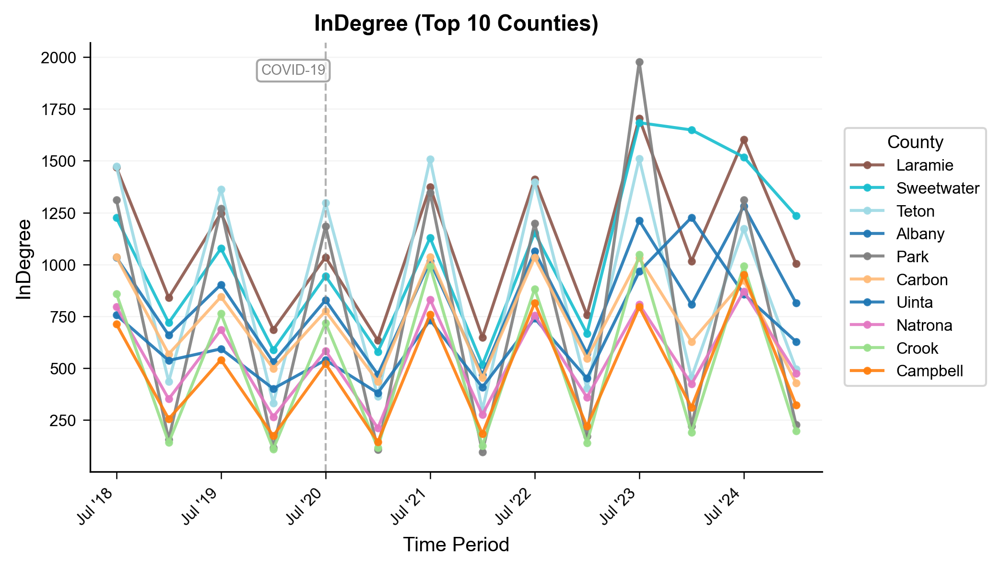

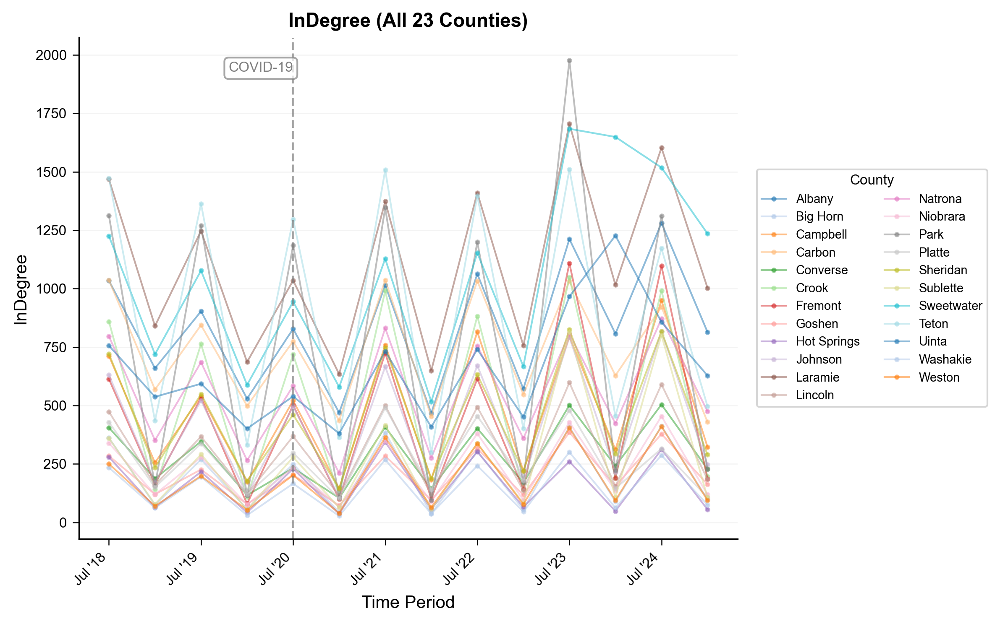

plotting timeseries for: OutDegree


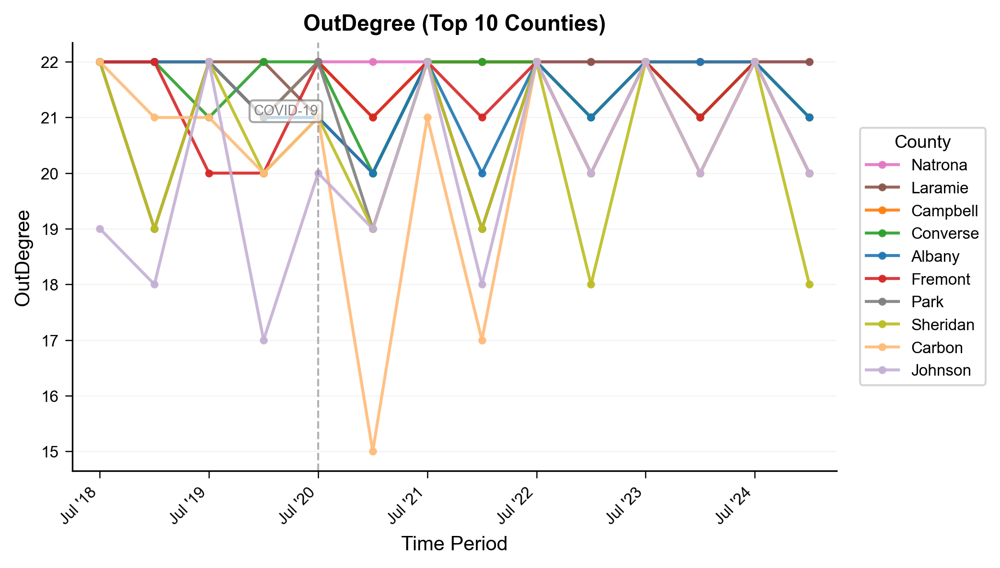

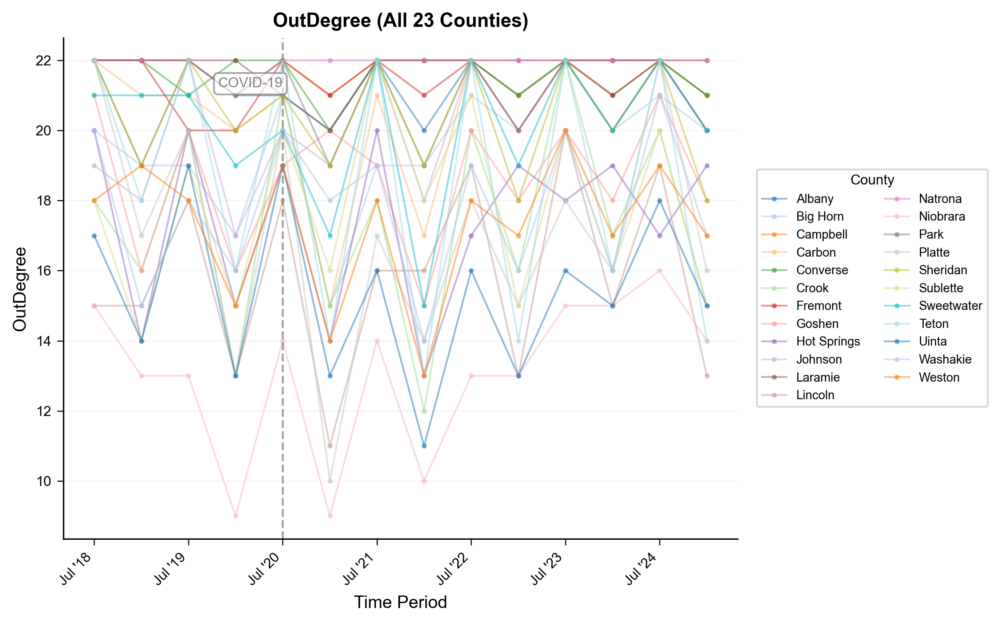

plotting timeseries for: Weighted_InStrength


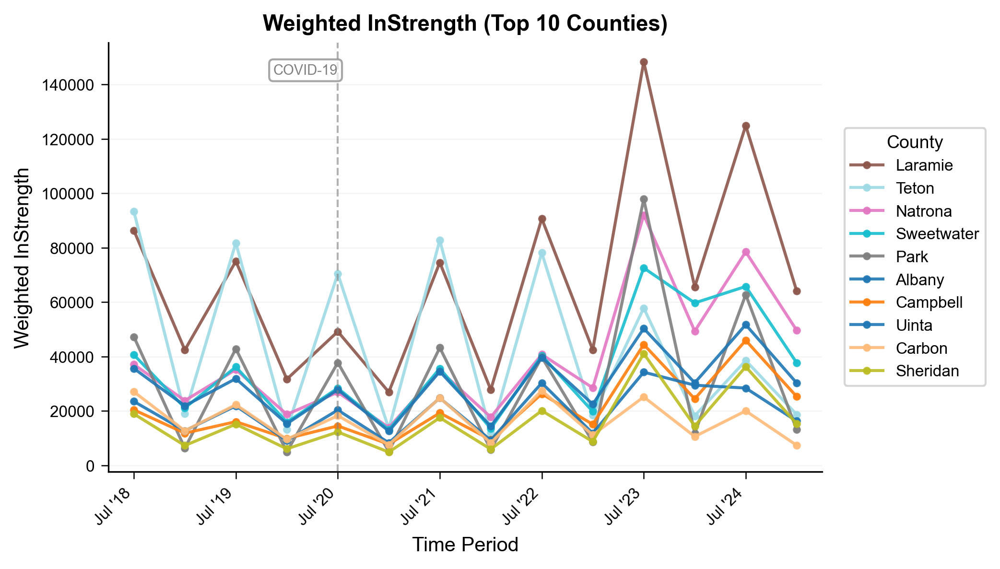

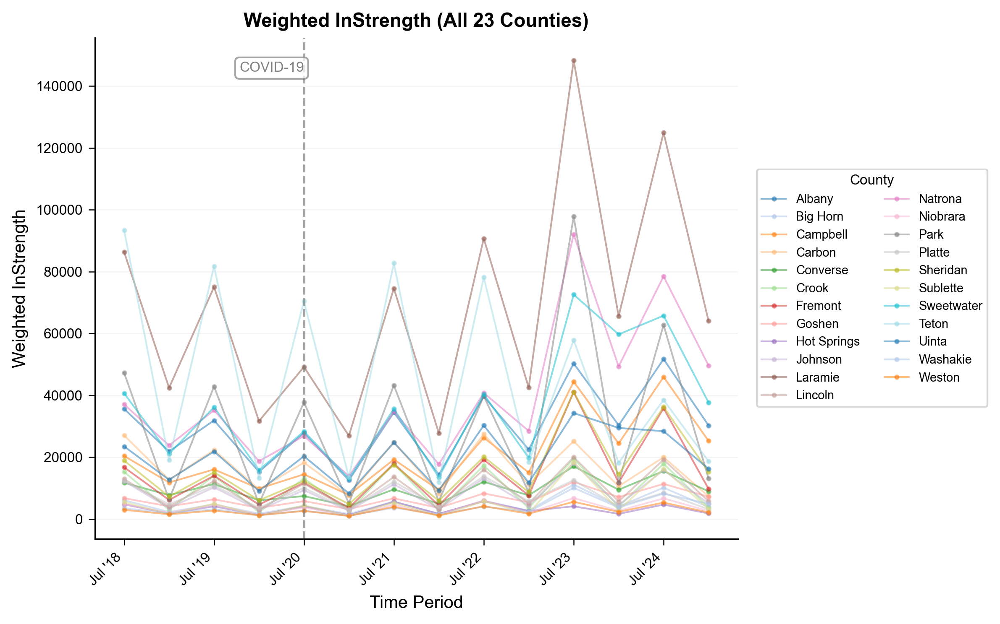

plotting timeseries for: Weighted_OutStrength


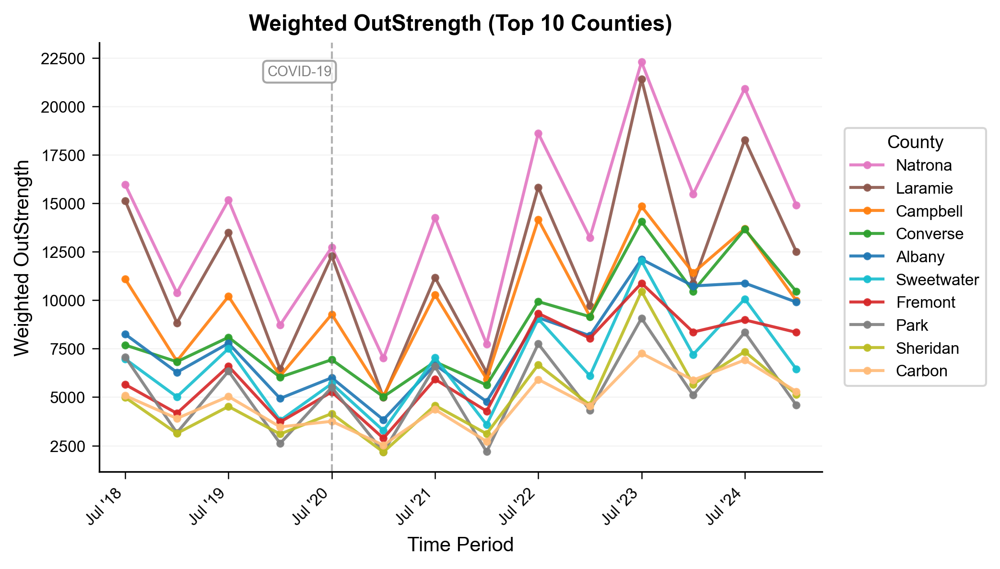

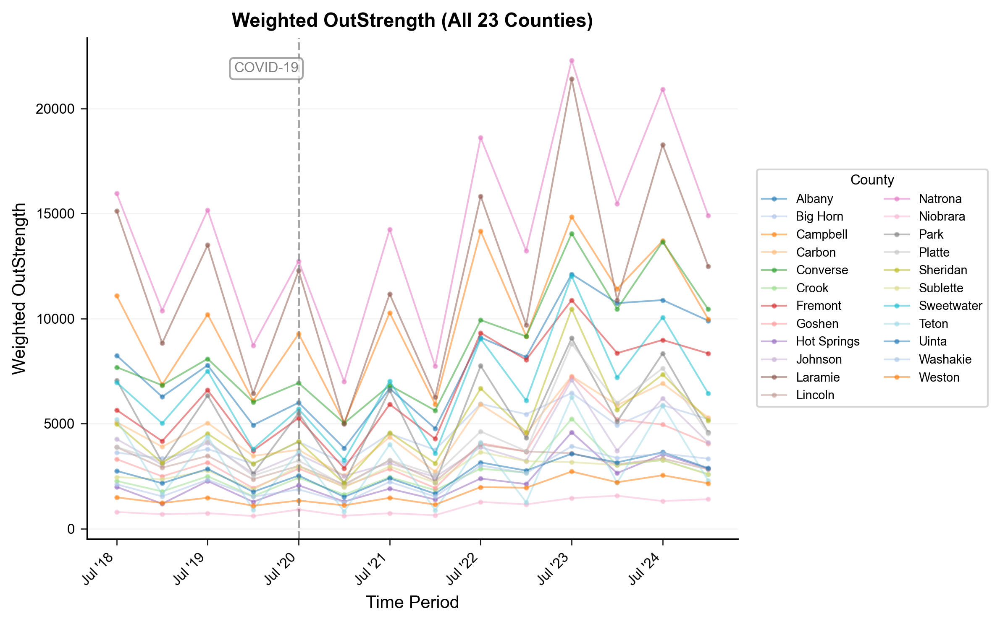

plotting timeseries for: PageRank


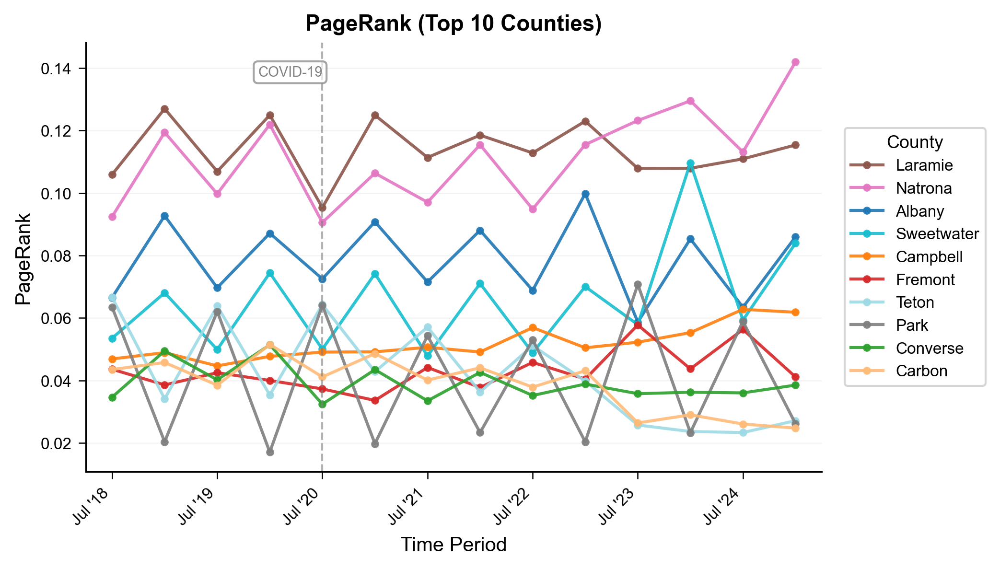

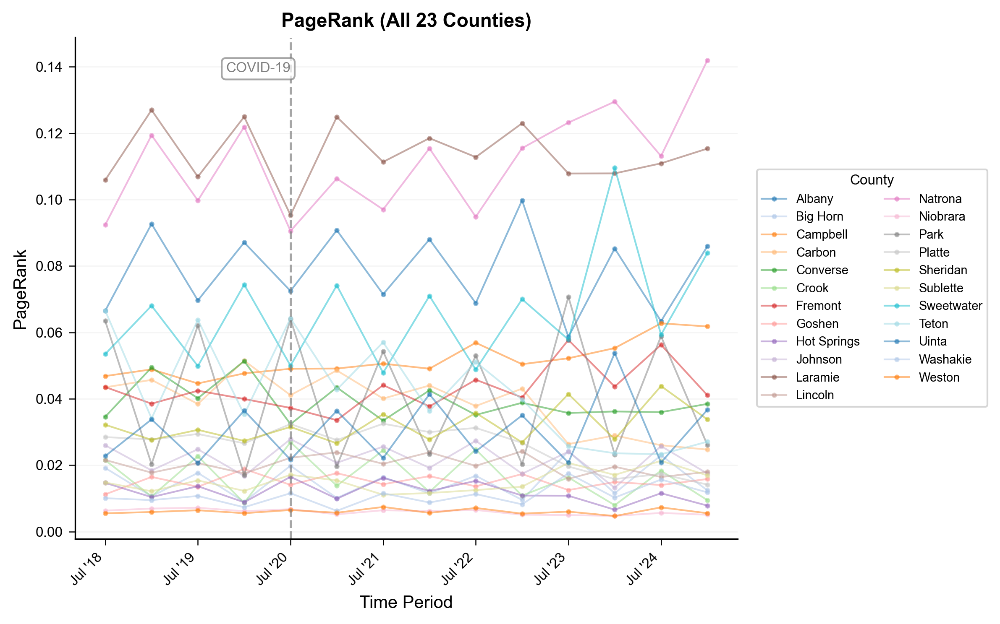

plotting timeseries for: Betweenness


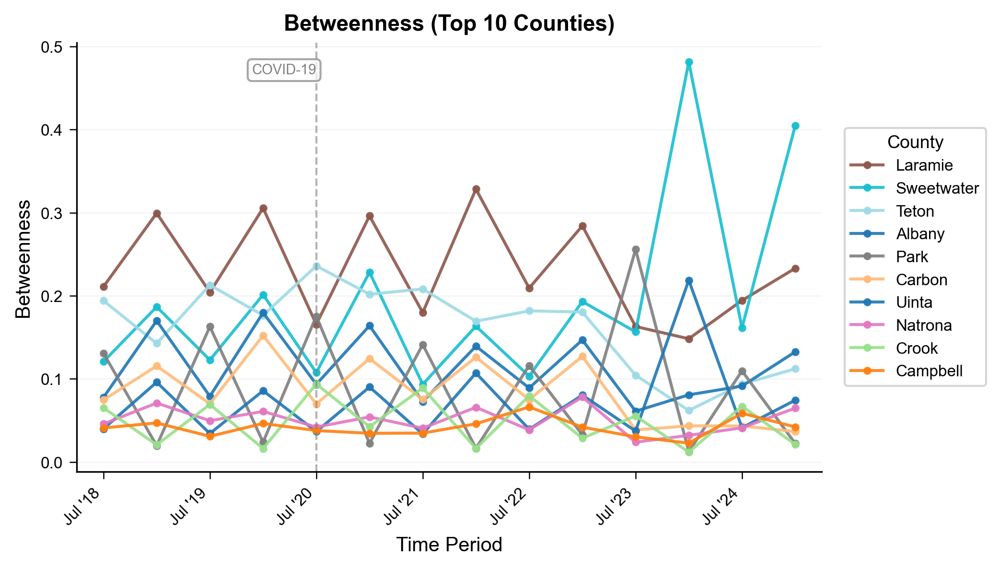

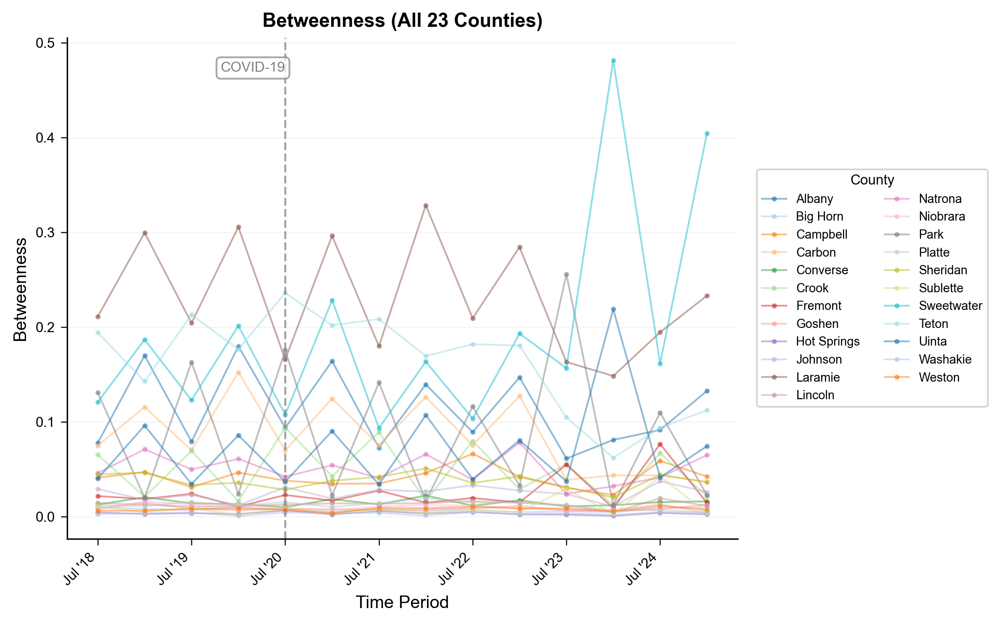

plotting timeseries for: Closeness


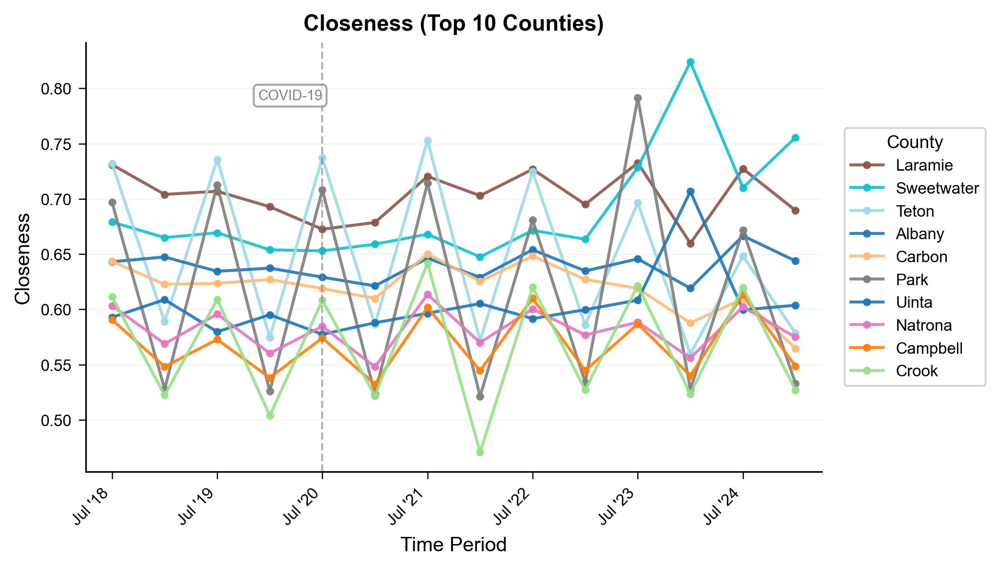

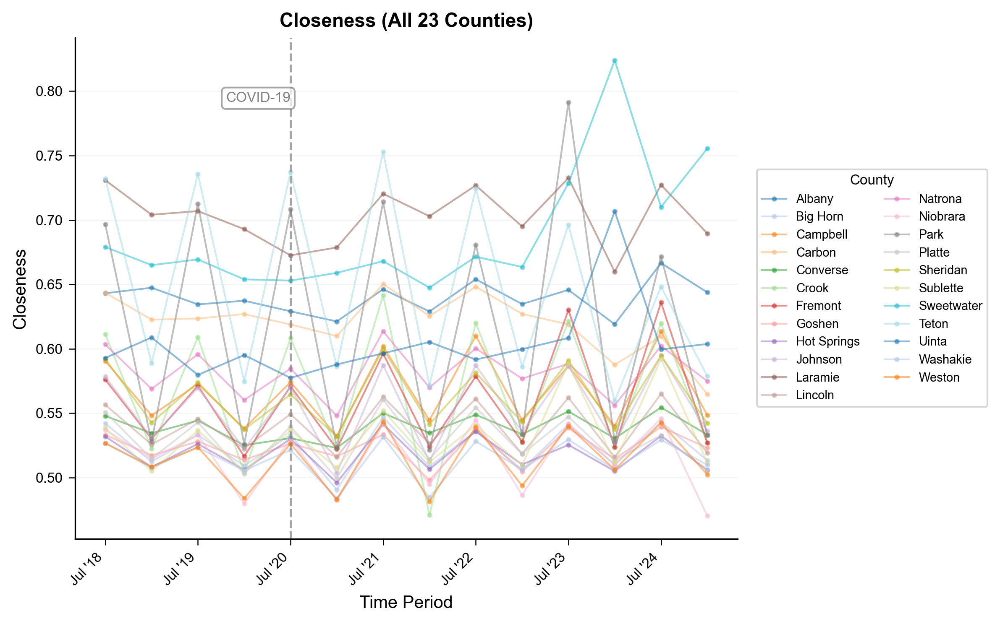

plotting timeseries for: Eigenvector


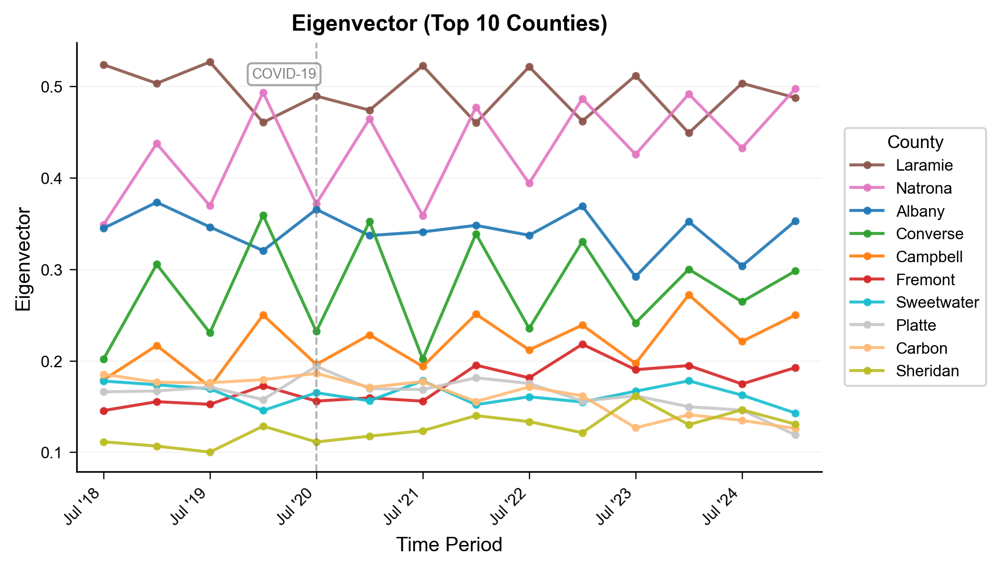

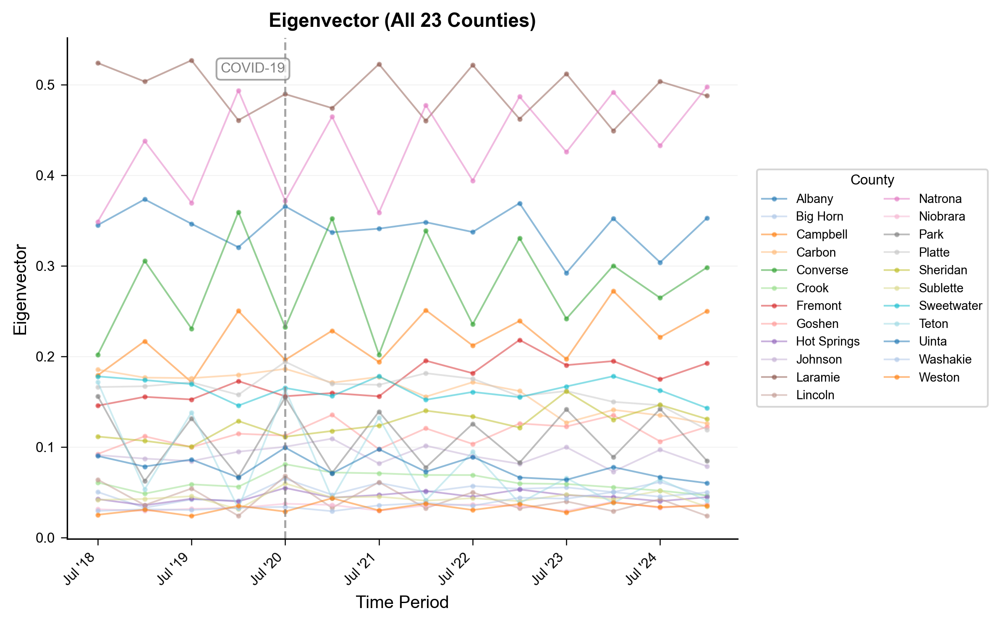

In [15]:
key_metrics = [
    'InDegree', 'OutDegree',
    'Weighted_InStrength', 'Weighted_OutStrength',
    'PageRank', 'Betweenness', 'Closeness', 'Eigenvector'
]

for metric in key_metrics:
    if metric not in data:
        continue
    print("plotting timeseries for:", metric)
    
    plot_clean_timeseries_top(
        metric,
        data[metric],
        top_n=10,
        covid_idx=covid_start_idx,
        savepath=output_dir / f"TS_{metric}_Top10_2018-2024.png"
    )
    
    plot_timeseries_all(
        metric,
        data[metric],
        covid_idx=covid_start_idx,
        savepath=output_dir / f"TS_{metric}_AllCounties_2018-2024.png"
    )


### ***2.6 Heatmaps***

heatmap for: InDegree


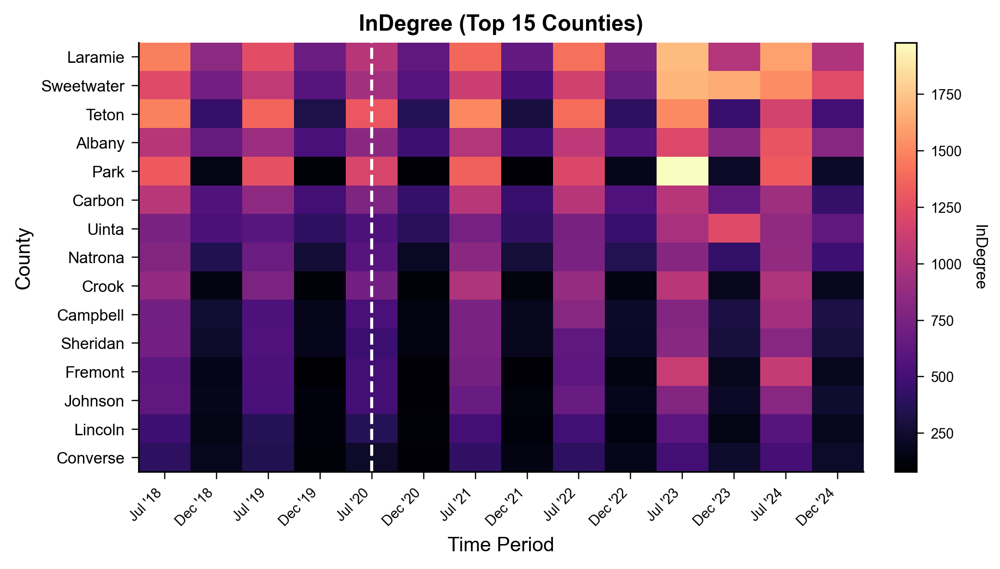

heatmap for: PageRank


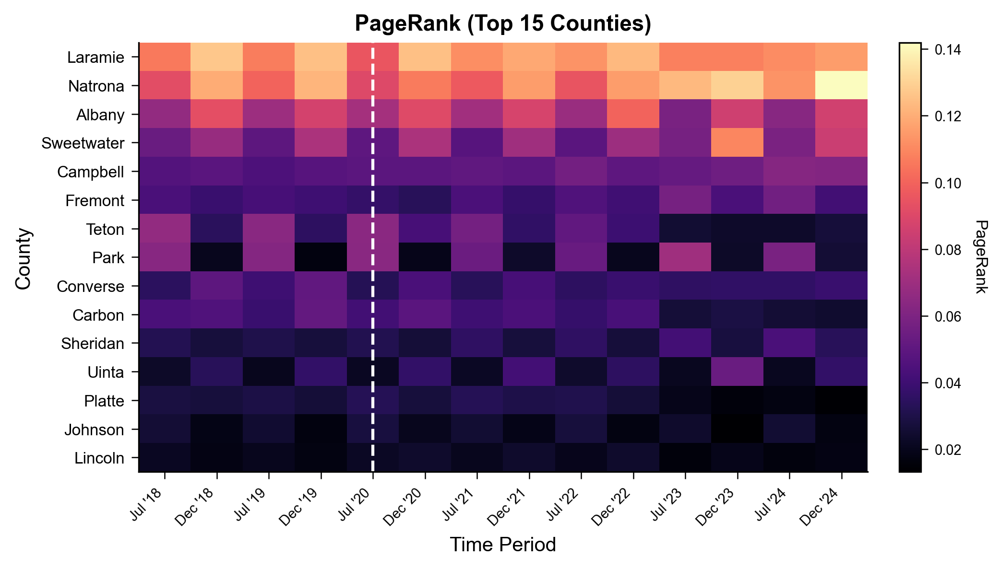

heatmap for: Weighted_InStrength


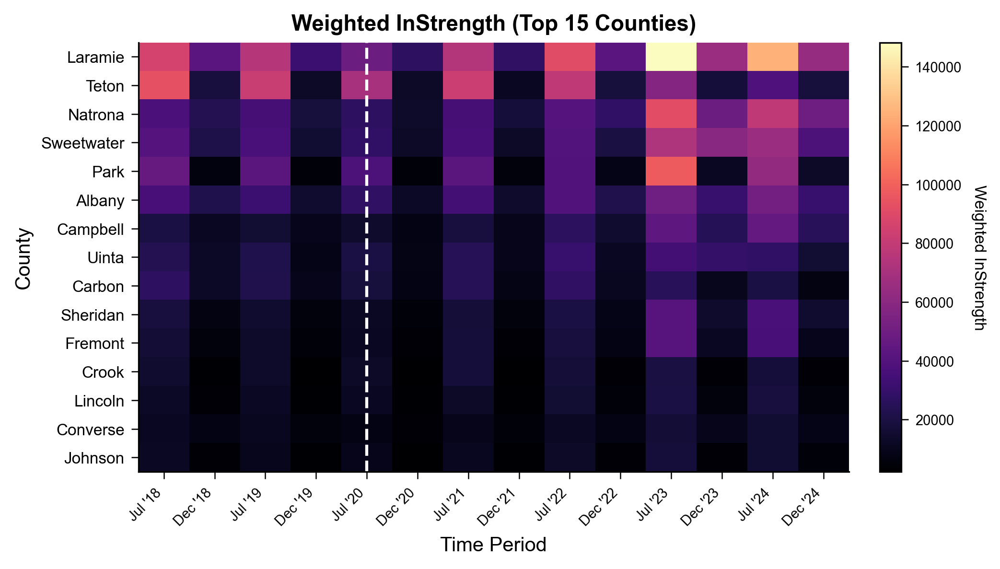

heatmap for: Betweenness


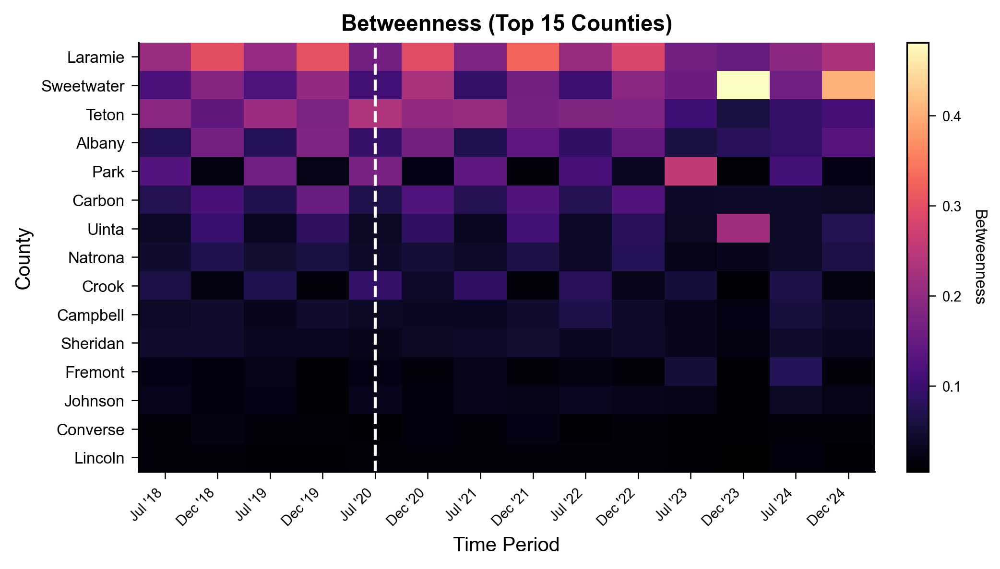

In [16]:
for metric in ['InDegree', 'PageRank', 'Weighted_InStrength', 'Betweenness']:
    if metric not in data:
        continue
    print("heatmap for:", metric)
    plot_heatmap_timeseries(
        metric,
        data[metric],
        top_n=15,
        covid_idx=covid_start_idx,
        savepath=output_dir / f"Heatmap_{metric}_Top15_ByTime_2018-2024.png"
    )


### ***2.7 COVID Impact Visualization Panels***

covid impact for: InDegree


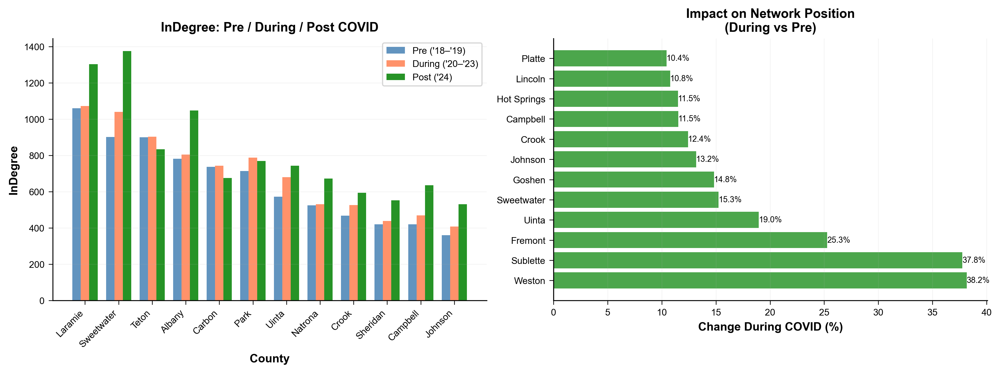

covid impact for: PageRank


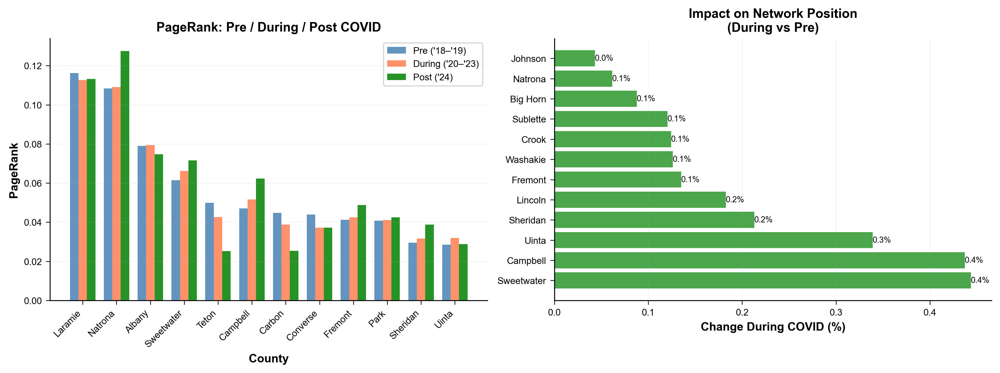

covid impact for: Weighted_InStrength


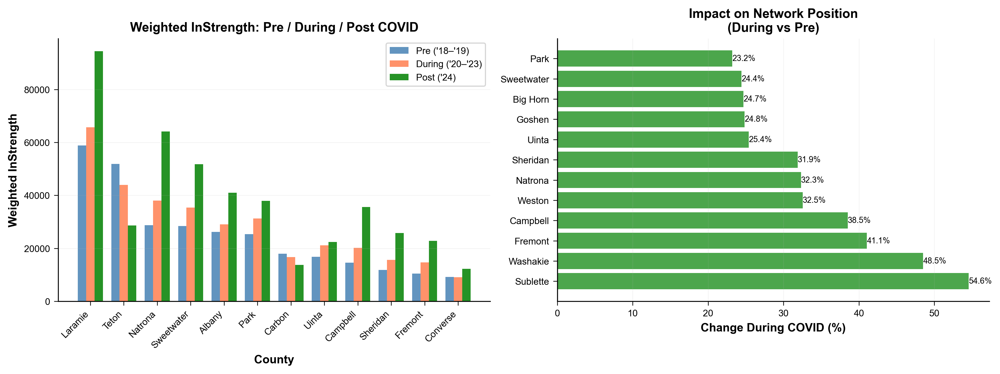

covid impact for: Betweenness


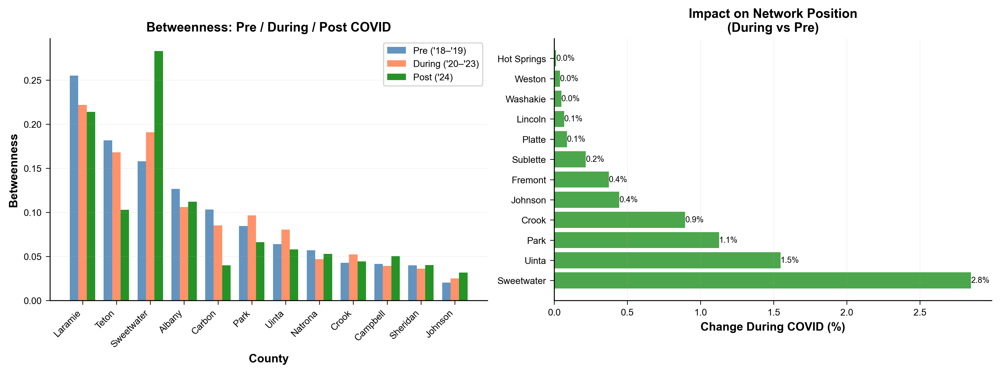

In [17]:
for metric in ['InDegree', 'PageRank', 'Weighted_InStrength', 'Betweenness']:
    if metric not in data:
        continue
    print("covid impact for:", metric)
    plot_covid_impact(
        metric,
        data[metric],
        savepath=output_dir / f"COVIDImpact_{metric}_PreDuringPost.png"
    )


### ***2.8 Radar plots by season***

radar for JULY only:


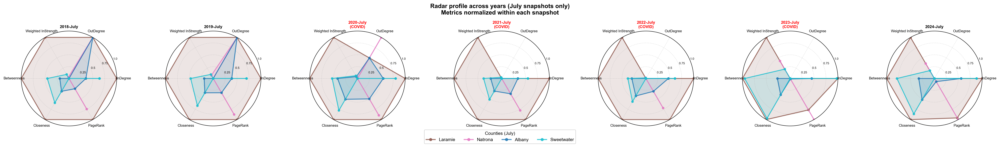

radar for DEC only:


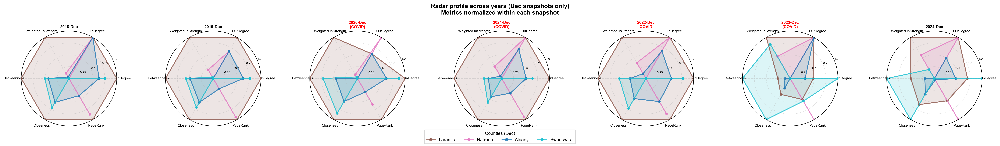

In [18]:
# pick most "important" counties across all time = top 4 PageRank mean
top_counties_overall = (
    data['PageRank']
    .mean(axis=1)
    .sort_values(ascending=False)
    .head(4)
    .index
    .tolist()
)

radar_metrics = [
    "InDegree", "OutDegree",
    "Weighted_InStrength",
    "Betweenness", "Closeness",
    "PageRank"
]

print("radar for JULY only:")
plot_radar_by_season(
    season_label="July",
    counties_to_compare=top_counties_overall,
    metrics_to_include=radar_metrics,
    savepath=output_dir / "Radar_July_2018-2024.png"
)

print("radar for DEC only:")
plot_radar_by_season(
    season_label="Dec",
    counties_to_compare=top_counties_overall,
    metrics_to_include=radar_metrics,
    savepath=output_dir / "Radar_Dec_2018-2024.png"
)


### ***2.9 County-Specific Normalized Traces***

normalized panel for: Laramie


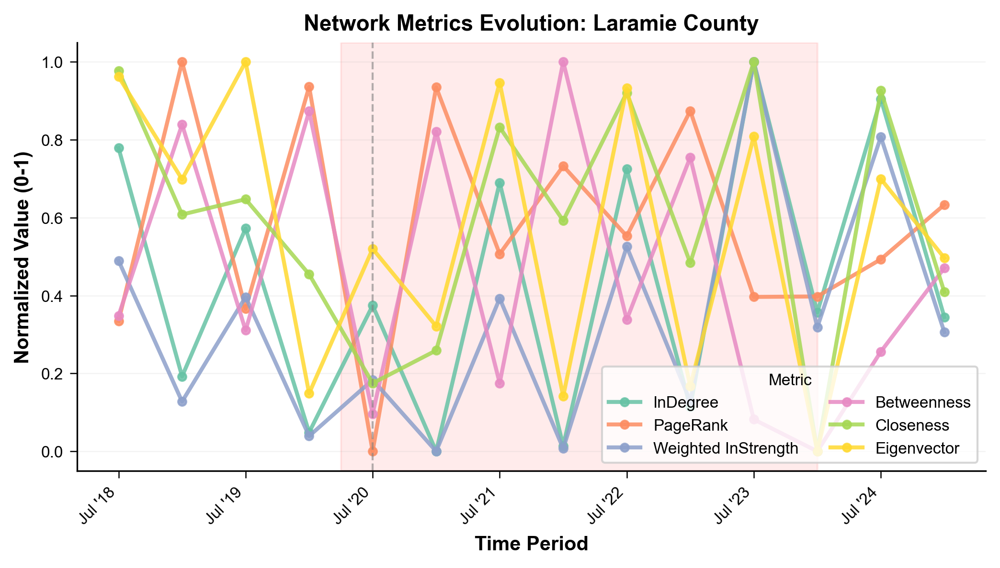

normalized panel for: Natrona


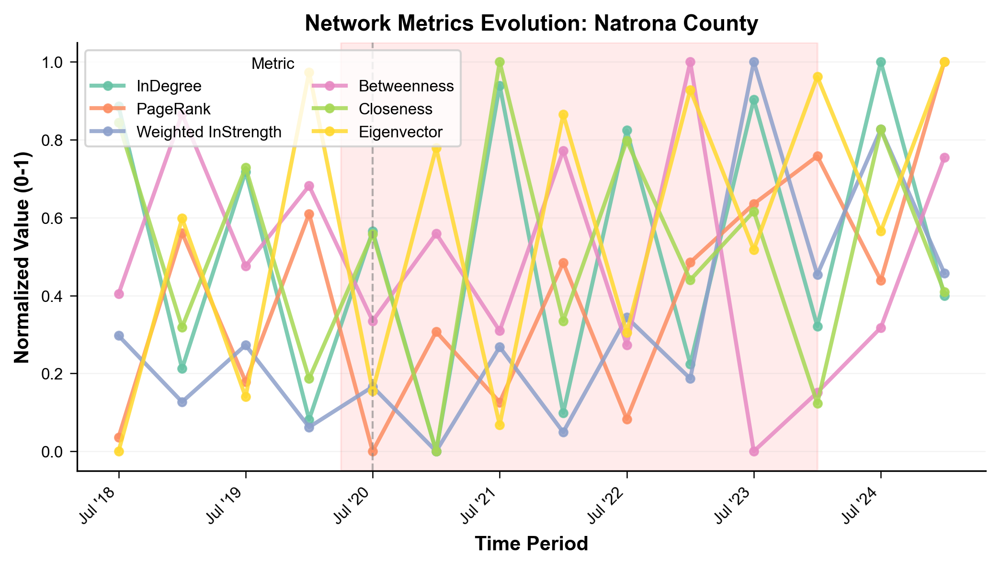

normalized panel for: Albany


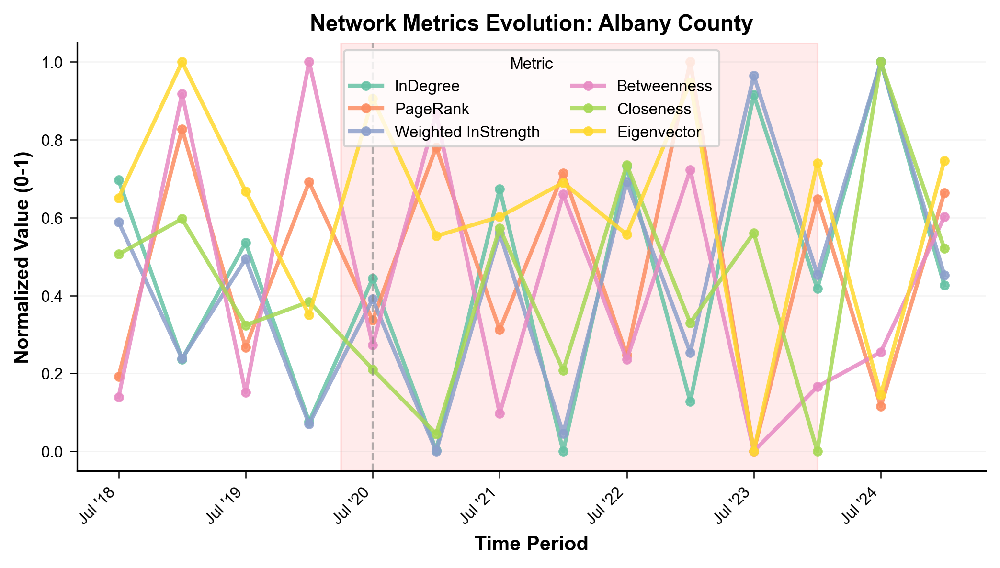

In [19]:
# grab top 3 PageRank hubs
top_3_for_norm = (
    data['PageRank']
    .mean(axis=1)
    .sort_values(ascending=False)
    .head(3)
    .index
    .tolist()
)

comparison_metrics = [
    'InDegree', 'PageRank',
    'Weighted_InStrength',
    'Betweenness', 'Closeness', 'Eigenvector'
]

for county in top_3_for_norm:
    print("normalized panel for:", county)
    plot_normalized_comparison(
        metrics_list=comparison_metrics,
        county_name=county,
        covid_idx=covid_start_idx,
        savepath=output_dir / f"Normalized_{county.replace(' ', '_')}_AllMetrics.png"
    )


### ***2.10 Correlation Trends: July Snapshots Over Time***

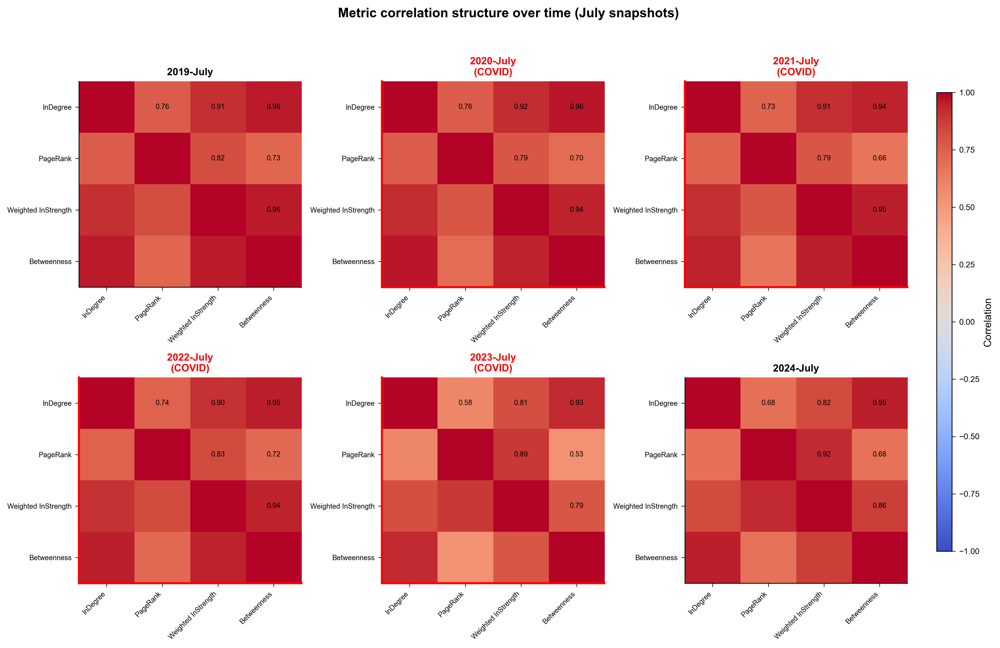

In [20]:
corr_metrics = ['InDegree', 'PageRank', 'Weighted_InStrength', 'Betweenness']

plot_correlation_evolution(
    corr_metrics,
    savepath=output_dir / "CorrelationEvolution_JulySnapshots.png"
)
